# 1.Preparation

## 1.1 Load libraries

In [65]:
import numpy as np

import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_style('whitegrid')

import warnings
warnings.filterwarnings('ignore')

from scipy import stats, linalg

import folium
from folium.plugins import MarkerCluster
from folium import plugins

import os
import glob

## 1.2 Load the dataset

In [89]:
path = os.path.join(os.getcwd(), "redesign")
almaty_directory = glob.glob(os.path.join(path, "almaty", "*.csv"))
astana_directory = glob.glob(os.path.join(path, "astana", "*.csv"))
ustkamenogorsk_directory = glob.glob(os.path.join(path, "ust-kamenogorsk", "*.csv"))

almaty = pd.concat((pd.read_csv(csv_file, quotechar='|', parse_dates=['date']) for csv_file in almaty_directory))
astana = pd.concat((pd.read_csv(csv_file, quotechar='|', parse_dates=['date']) for csv_file in astana_directory))
ust_kamenogorsk = pd.concat((pd.read_csv(csv_file, quotechar='|', parse_dates=['date']) for csv_file in ustkamenogorsk_directory))

In [90]:
ust_kamenogorsk = ust_kamenogorsk[(pd.notnull(ust_kamenogorsk['price']))
                          & (pd.notnull(ust_kamenogorsk['room_count']))
                          & (pd.notnull(ust_kamenogorsk['building_year']))
                          & (pd.notnull(ust_kamenogorsk['area_total']))
                          & (pd.notnull(ust_kamenogorsk['lat']))
                          & (pd.notnull(ust_kamenogorsk['lon']))]

In [41]:
cities = [almaty, astana, ust_kamenogorsk]
data = pd.concat(cities)

In [42]:
data['city'] = data['city'].astype('category', ordered=True)
data['building_type'] = data['building_type'].astype('category', ordered=True)
data['renovation'] = data['renovation'].astype('category', ordered=True)
data['toilet'] = data['toilet'].astype('category', ordered=True)
data['balcony'] = data['balcony'].astype('category', ordered=True)
data['balcony_glass'] = data['balcony_glass'].astype('category', ordered=True)
data['door'] = data['door'].astype('category', ordered=True)
data['phone'] = data['phone'].astype('category', ordered=True)
data['inet_type'] = data['inet_type'].astype('category', ordered=True)
data['furniture'] = data['furniture'].astype('category', ordered=True)
data['floor_type'] = data['floor_type'].astype('category', ordered=True)
data['security'] = data['security'].astype('category', ordered=True)
data['priv_dorm'] = data['priv_dorm'].astype('category', ordered=True)
data['parking'] = data['parking'].astype('category', ordered=True)
data['complex'] = data['complex'].astype('category', ordered=False)
data

,id,date,city,address,lat,lon,price,view_count,room_count,image_count,color,is_owner,building_type,building_year,floor,building_floors,area_total,area_living,area_kitchen,renovation,toilet,balcony,balcony_glass,door,phone,inet_type,furniture,floor_type,security,priv_dorm,parking,room_height,complex
0,30339836,2018-07-29,Алматы,"Ауэзовский р-н, мкр Аксай-1, Сайна 8 — Толе би",43.242199,76.833000,4999000,44,1,2,NaN,1,кирпичный,1972.0,2.0,4.0,20.0,20.0,NaN,евроремонт,совмещенный,NaN,NaN,металлическая,есть возможность подключения,проводной,пустая,дерево,"домофон, видеонаблюдение",да,NaN,NaN,NaN
1,30037494,2018-07-29,Алматы,"Алмалинский р-н, Гагарина — Курманазы",43.240184,76.895034,16500000,138,1,3,NaN,1,кирпичный,1987.0,4.0,8.0,35.4,17.2,8.3,евроремонт,совмещенный,лоджия,да,металлическая,NaN,NaN,полностью меблирована,паркет,домофон,нет,NaN,2.8,NaN
2,30339814,2018-07-29,Алматы,"Алатауский р-н, мкр Акбулак, Чуланова 157 — Мо...",43.253319,76.825443,11000000,7,1,0,NaN,1,монолитный,2012.0,8.0,9.0,40.0,20.0,9.0,хорошее,совмещенный,лоджия,да,металлическая,отдельный,оптика,NaN,NaN,"домофон, видеонаблюдение, решетки на окнах",нет,NaN,3 м,NaN
3,30317756,2018-07-29,Алматы,"Алмалинский р-н, Муратбаева — Кабанбай батыра",43.248413,76.919657,13200000,35,1,0,green,0,кирпичный,1974.0,3.0,5.0,41.0,21.0,11.0,требует ремонта,совмещенный,NaN,NaN,металлическая,есть возможность подключения,NaN,пустая,NaN,"домофон, видеонаблюдение",нет,NaN,2.9,NaN
4,30339786,2018-07-29,Алматы,"Бостандыкский р-н, Гагарина — Басенова",43.222502,76.896453,13000000,46,2,9,NaN,1,кирпичный,1967.0,2.0,4.0,32.1,21.7,4.1,евроремонт,совмещенный,балкон,NaN,металлическая,есть возможность подключения,через TV кабель,полностью меблирована,линолеум,домофон,нет,NaN,2.7,NaN
5,30188868,2018-07-29,Алматы,"Турксибский р-н, Акан-серы 10 — Спартака",43.332420,76.953150,12000000,33,1,4,NaN,1,кирпичный,1964.0,2.0,3.0,32.2,16.3,7.3,хорошее,совмещенный,балкон,да,металлическая,отдельный,NaN,полностью меблирована,линолеум,домофон,нет,рядом охраняемая стоянка,2.7,NaN
6,30309277,2018-07-29,Алматы,"Алмалинский р-н, Кабанбай батыра 314 — Гагарина",43.250701,76.915201,22000000,83,3,20,NaN,1,панельный,1978.0,2.0,5.0,64.0,58.0,6.0,хорошее,NaN,балкон,да,металлическая,отдельный,проводной,частично меблирована,NaN,"решетки на окнах, домофон",нет,NaN,2.6,NaN
7,30265143,2018-07-29,Алматы,"Ауэзовский р-н, мкр Мамыр-1 29/7 — Ул.Шаляпина",43.212410,76.844459,23999999,161,2,14,NaN,1,монолитный,2015.0,7.0,17.0,70.0,NaN,12.0,хорошее,раздельный,лоджия,да,бронированная,есть возможность подключения,через TV кабель,полностью меблирована,ламинат,"охрана, домофон, видеонаблюдение",нет,паркинг,2.8,Спутник
8,30339665,2018-07-29,Алматы,"Бостандыкский р-н, мкр Алмагуль 40 — Жарокова-...",43.204118,76.903253,16600000,9,1,0,NaN,1,панельный,1989.0,3.0,9.0,41.0,20.0,10.0,хорошее,совмещенный,NaN,NaN,бронированная,NaN,через TV кабель,полностью меблирована,линолеум,NaN,нет,NaN,2.8,NaN
9,30339660,2018-07-29,Алматы,"Бостандыкский р-н, Торайгырова — Аль-Фараби",43.201143,76.870146,16500000,2,2,8,NaN,0,панельный,1977.0,3.0,5.0,45.0,35.0,6.0,евроремонт,совмещенный,балкон,да,металлическая,отдельный,ADSL,частично меблирована,ламинат,домофон,нет,рядом охраняемая стоянка,2.2,NaN


In [43]:
data.dtypes

id                          int64
date               datetime64[ns]
city                     category
address                    object
lat                       float64
lon                       float64
price                       int64
view_count                  int64
room_count                 object
image_count                 int64
color                      object
is_owner                    int64
building_type            category
building_year             float64
floor                     float64
building_floors           float64
area_total                float64
area_living               float64
area_kitchen              float64
renovation               category
toilet                   category
balcony                  category
balcony_glass            category
door                     category
phone                    category
inet_type                category
furniture                category
floor_type               category
security                 category
priv_dorm     

# 2. Descriptive statistics

In [46]:
data.shape

(90598, 33)

In [47]:
data.describe(include='all')

,id,date,city,address,lat,lon,price,view_count,room_count,image_count,color,is_owner,building_type,building_year,floor,building_floors,area_total,area_living,area_kitchen,renovation,toilet,balcony,balcony_glass,door,phone,inet_type,furniture,floor_type,security,priv_dorm,parking,room_height,complex
count,9.059800e+04,90598,90598,90598,90007.000000,90007.000000,9.059800e+04,90598.000000,90598.0,90598.000000,9757,90598.000000,80232,90408.000000,89516.000000,88513.000000,90595.000000,36753.000000,54507.000000,83089,78069,62994,47884,64641,50155,44490,62923,61973,59394,82412,44424,47973,37639
unique,NaN,18,5,31962,NaN,NaN,NaN,NaN,31.0,NaN,4,NaN,5,NaN,NaN,NaN,NaN,NaN,NaN,6,4,4,1,3,4,4,3,7,449,2,3,67,1248
top,NaN,2018-07-27 00:00:00,Астана,"Есильский р-н, проспект Улы Дала",NaN,NaN,NaN,NaN,2.0,NaN,red,NaN,кирпичный,NaN,NaN,NaN,NaN,NaN,NaN,хорошее,совмещенный,балкон,да,металлическая,отдельный,ADSL,частично меблирована,ламинат,домофон,нет,рядом охраняемая стоянка,3 м,Хайвил Астана
freq,NaN,11495,40006,285,NaN,NaN,NaN,NaN,29873.0,NaN,4341,NaN,30199,NaN,NaN,NaN,NaN,NaN,NaN,35818,33982,30594,47884,52824,39285,18087,32005,30044,19227,80568,23301,12124,737
first,NaN,2018-07-13 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,2018-12-07 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2.916114e+07,NaN,NaN,NaN,47.474446,75.103481,2.592901e+07,356.028864,NaN,7.646118,NaN,0.362039,NaN,1997.717879,5.328746,8.995741,74.643708,41.998076,10.782822,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,2.472322e+06,NaN,NaN,NaN,3.845313,4.110027,4.701839e+07,934.640610,NaN,7.239299,NaN,0.480593,NaN,18.416303,4.031174,5.605296,566.439124,27.917277,5.539746,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,4.456500e+04,NaN,NaN,NaN,3.777177,1.272591,5.000000e+05,0.000000,NaN,0.000000,NaN,0.000000,NaN,1900.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,2.936404e+07,NaN,NaN,NaN,43.237429,71.439216,1.250000e+07,14.000000,NaN,3.000000,NaN,0.000000,NaN,1982.000000,3.000000,5.000000,44.000000,26.000000,7.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 3. Setting the context (map visualization)

In [93]:
houses_map = folium.Map(location = [ust_kamenogorsk['lat'].mean(),
                                    ust_kamenogorsk['lon'].mean()], 
                        zoom_start = 10)
marker_cluster = MarkerCluster().add_to(houses_map)
MAX_RECORDS = 100
for name, row in ust_kamenogorsk.iterrows():
    folium.Marker([row['lat'], row['lon']],
                   popup = "price = {0} тг.".format(row['price'])).add_to(marker_cluster)

houses_map

In [107]:
houses_heatmap = folium.Map(location = [ust_kamenogorsk['lat'].mean(),
                                        ust_kamenogorsk['lon'].mean()],
                            zoom_start = 9)
houses_heatmap.add_children(plugins.HeatMap([[row['lat'], row['lon']] 
                                             for name, row in ust_kamenogorsk.iterrows()],
                                            radius = 10))
houses_heatmap

# 4. The output variable

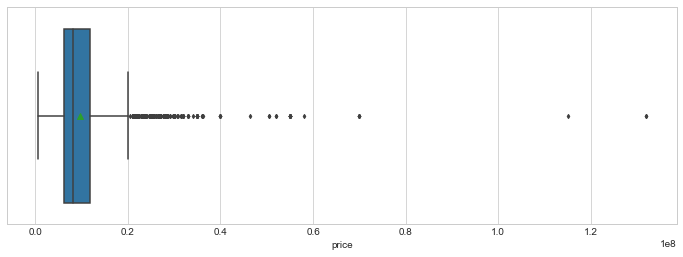

In [94]:
fig, ax = plt.subplots(figsize=(12,4))
sns.boxplot(x = 'price', 
            data = ust_kamenogorsk, 
            orient = 'h', 
            fliersize = 3, 
            showmeans = True, 
            ax = ax)
plt.show()

# 5. Associations and Correlations between Variables

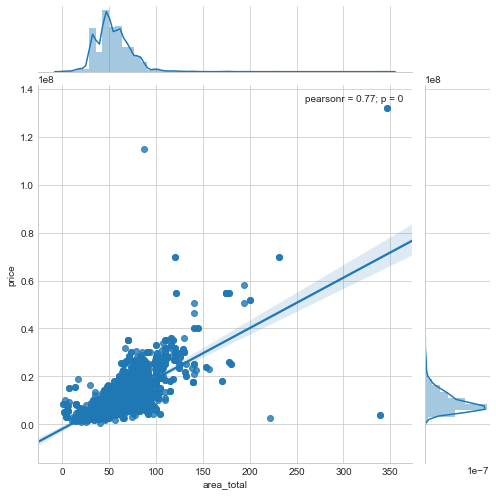

In [95]:
sns.jointplot(x = 'area_total', 
              y = 'price', 
              data = ust_kamenogorsk,
              kind = 'reg',
              size = 7)
plt.show()

In [97]:
ust_kamenogorsk[pd.notnull(ust_kamenogorsk['lat'])]

,id,date,city,address,lat,lon,price,view_count,room_count,image_count,color,is_owner,building_type,building_year,floor,building_floors,area_total,area_living,area_kitchen,renovation,toilet,balcony,balcony_glass,door,phone,inet_type,furniture,floor_type,security,priv_dorm,parking,room_height,complex
0,30128683,2018-07-28,Усть-Каменогорск,Независимости 61/3,49.978068,82.582201,6000000,57,1,6,NaN,1,панельный,1990.0,2.0,5.0,35.0,NaN,NaN,евроремонт,совмещенный,NaN,NaN,металлическая,NaN,NaN,полностью меблирована,NaN,"домофон, видеонаблюдение",NaN,NaN,2.5,NaN
1,26080488,2018-07-28,Усть-Каменогорск,Ворошилова 97,49.968811,82.606702,10500000,66,3,9,NaN,1,панельный,1979.0,1.0,5.0,70.0,68.0,9.0,хорошее,раздельный,NaN,NaN,металлическая,отдельный,NaN,полностью меблирована,дерево,"решетки на окнах, домофон",нет,рядом охраняемая стоянка,NaN,Ворошилова 97
2,30184617,2018-07-28,Усть-Каменогорск,Сатпаева 20,49.903305,82.623033,7700000,45,1,7,NaN,1,панельный,1983.0,3.0,5.0,34.0,NaN,NaN,хорошее,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,нет,NaN,NaN,NaN
3,21206998,2018-07-28,Усть-Каменогорск,Ворошилова 143,49.968829,82.605310,7000000,32,2,7,NaN,1,панельный,1976.0,5.0,5.0,44.3,NaN,NaN,NaN,раздельный,балкон,NaN,металлическая,NaN,проводной,NaN,NaN,домофон,нет,рядом охраняемая стоянка,NaN,NaN
4,28430426,2018-07-28,Усть-Каменогорск,Островского 34/1,49.898703,82.682816,8900000,90,2,0,NaN,1,панельный,1986.0,5.0,5.0,50.0,NaN,NaN,евроремонт,раздельный,балкон,да,металлическая,есть возможность подключения,через TV кабель,частично меблирована,ламинат,домофон,NaN,NaN,2.8,NaN
5,30184628,2018-07-28,Усть-Каменогорск,Бобровская 4,49.948759,82.628459,5000000,51,1,9,NaN,1,панельный,2000.0,3.0,5.0,35.0,NaN,NaN,хорошее,совмещенный,NaN,NaN,металлическая,NaN,NaN,полностью меблирована,NaN,NaN,NaN,паркинг,NaN,NaN
6,30305591,2018-07-28,Усть-Каменогорск,Библиотека Пушкина,49.946539,82.654852,4700000,10,1,0,NaN,0,NaN,1964.0,5.0,5.0,32.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,нет,NaN,NaN,NaN
7,22361648,2018-07-28,Усть-Каменогорск,проспект Карла Маркса 24/1,49.896772,82.614861,19500000,3866,4,9,green,1,кирпичный,2007.0,2.0,9.0,76.0,NaN,NaN,евроремонт,NaN,лоджия,да,металлическая,отдельный,NaN,полностью меблирована,ламинат,"решетки на окнах, домофон",нет,рядом охраняемая стоянка,NaN,NaN
8,30295252,2018-07-28,Усть-Каменогорск,проспект Сатпаева 12,49.900142,82.622656,9900000,40,3,11,NaN,0,кирпичный,1983.0,9.0,9.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,нет,NaN,NaN,NaN
9,29935396,2018-07-28,Усть-Каменогорск,проспект Сатпаева,49.901941,82.622405,9300000,440,3,10,red,0,NaN,1977.0,5.0,5.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,нет,NaN,NaN,NaN
